# Food Prices In India

In [11]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [12]:
from datetime import datetime
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np


In [13]:
# Using double backslashes
df = pd.read_csv('C:\\New folder\\food_prices_ind.csv', low_memory=False)

# or

# Using raw string
# df = pd.read_csv(r'C:\New folder\food_prices_ind.csv', low_memory=False)


In [14]:
# Replace non-numeric values with NaN
df[['latitude', 'longitude', 'price', 'usdprice']] = df[['latitude', 'longitude', 'price', 'usdprice']].apply(pd.to_numeric, errors='coerce')

# Continue with the rest of your code
df['longitude'] = df['longitude'].replace(np.nan, 78.9629)
df[['admin1', 'admin2']] = df[['admin1', 'admin2']].replace(np.nan, 'India')

In [18]:
# Cleaning and Preprocessing the data
df['latitude'] = df['latitude'].replace(np.nan, 20.5937)
df['longitude'] = df['longitude'].replace(np.nan, 78.9629)
df[['admin1', 'admin2']] = df[['admin1', 'admin2']].replace(np.nan, 'India')

# Filter out rows with invalid 'date' values
df = df[df['date'].str.startswith('#') == False]

# Convert 'date' column to datetime format
try:
    df['date'] = pd.to_datetime(df['date'])
except pd.errors.DateParseError as e:
    print(f"Error occurred while parsing dates: {e}")

# Convert selected columns to float data type
df[['latitude', 'longitude', 'price', 'usdprice']] = df[['latitude', 'longitude', 'price', 'usdprice']].astype('float')



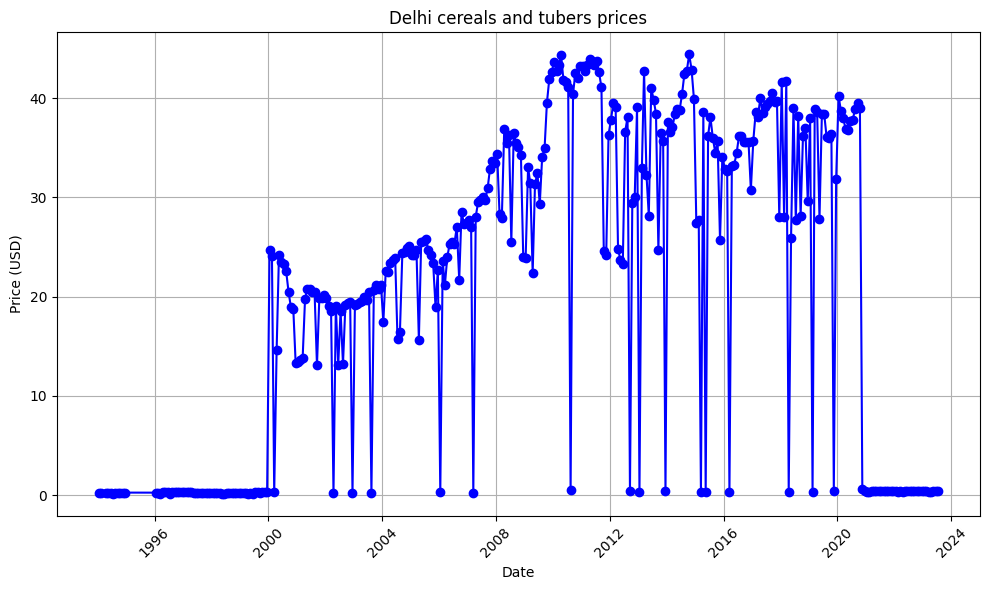

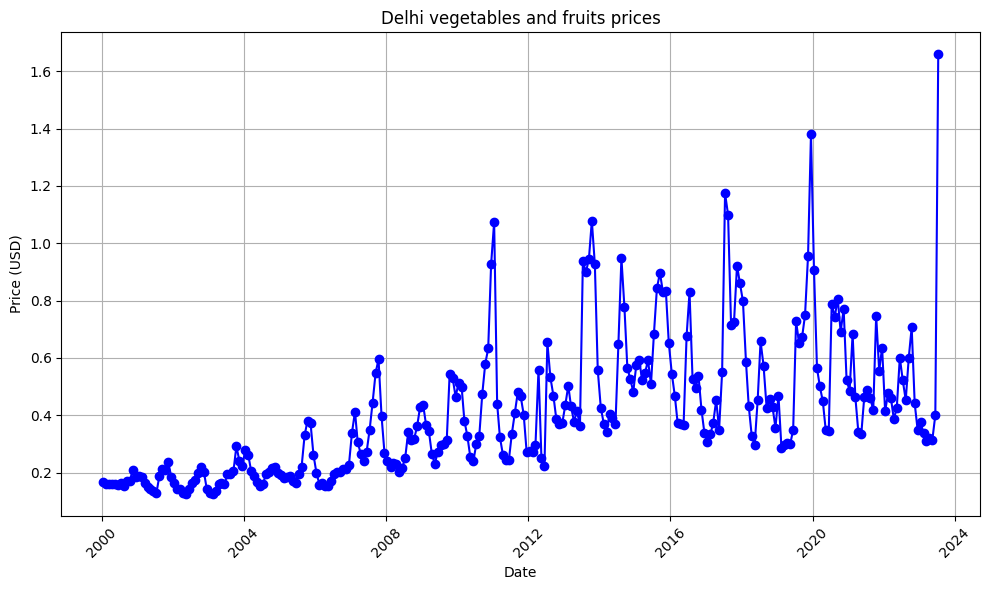

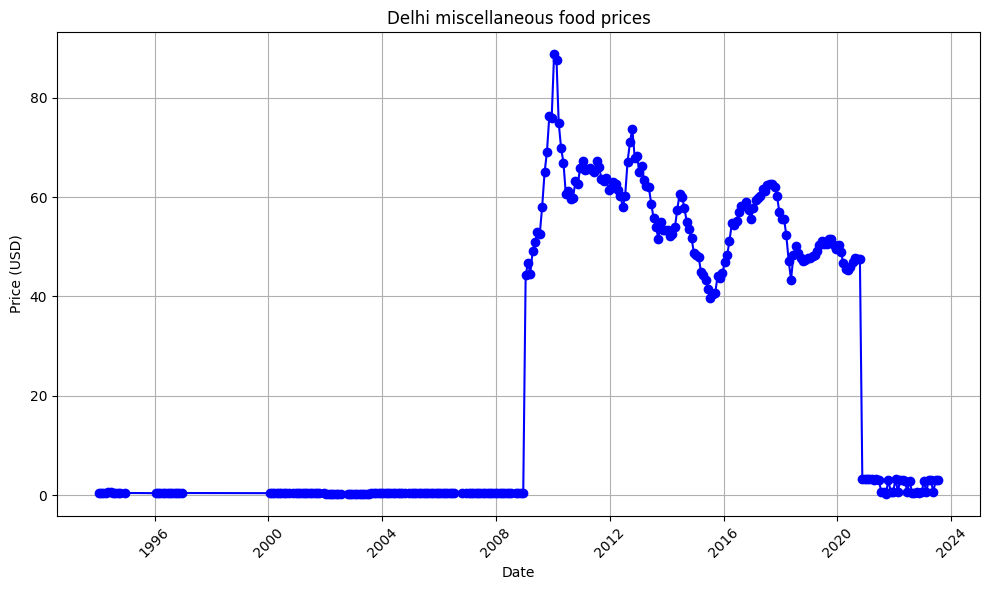

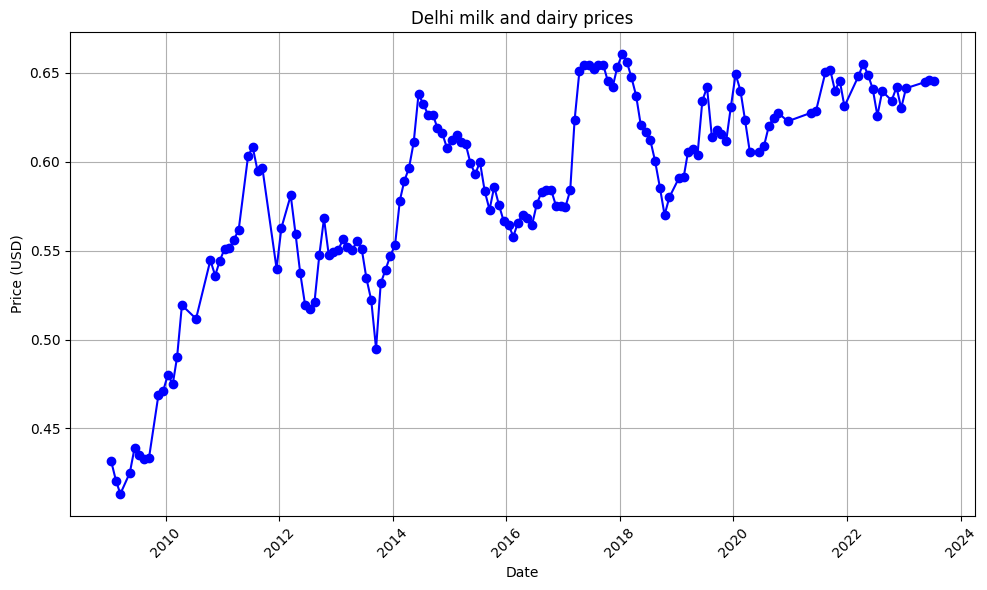

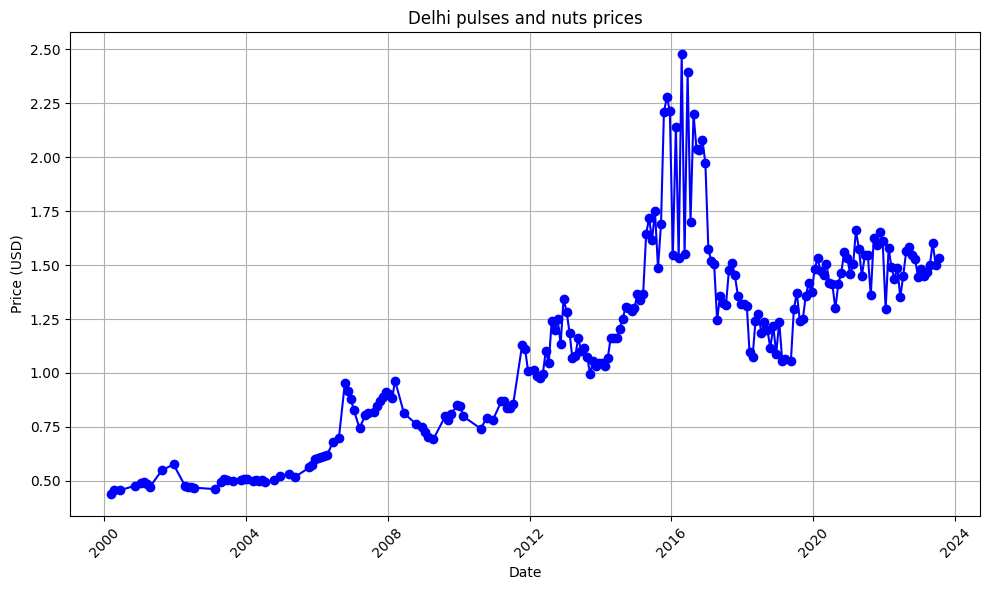

...

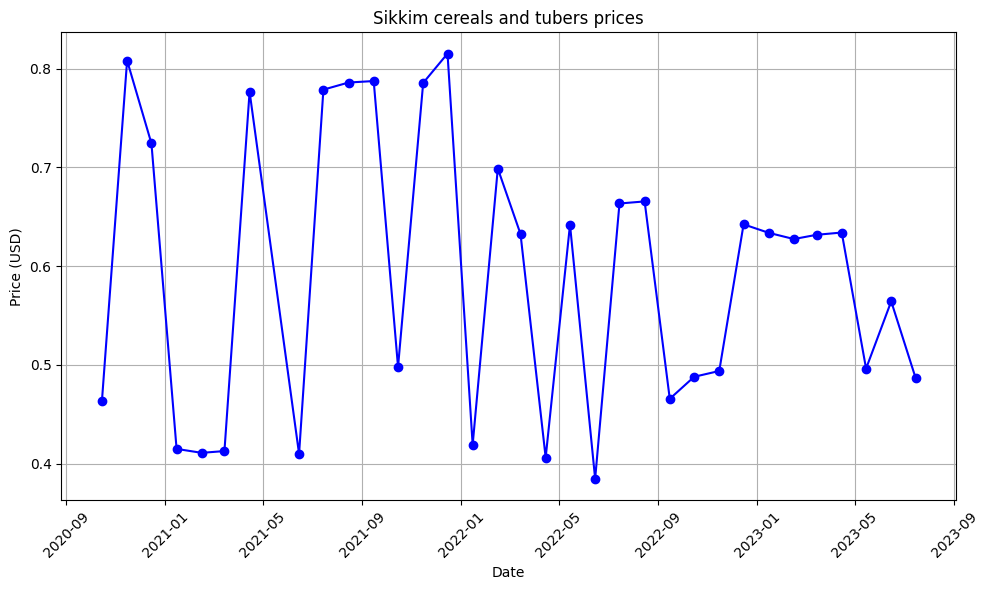

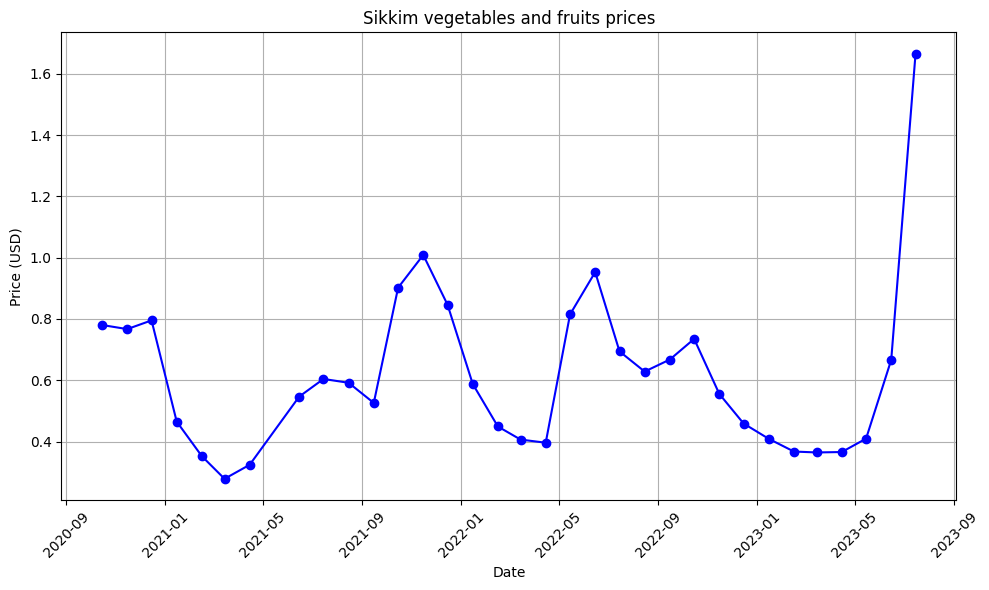

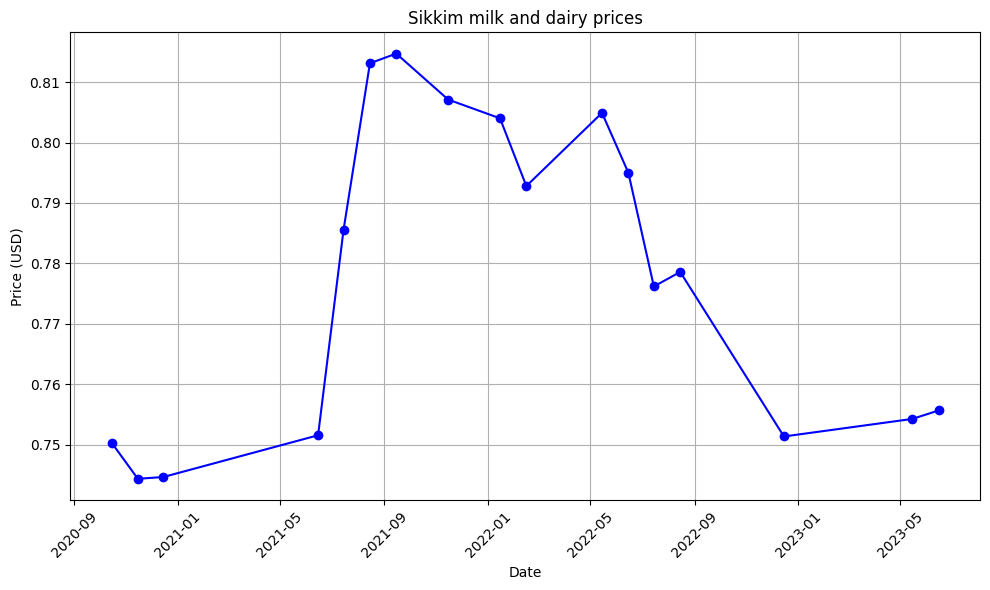

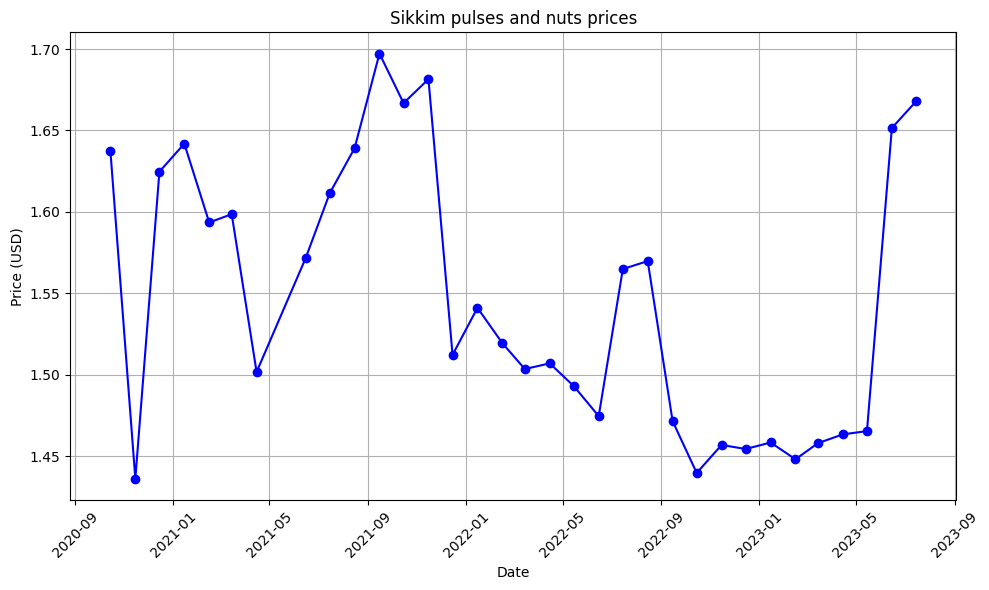

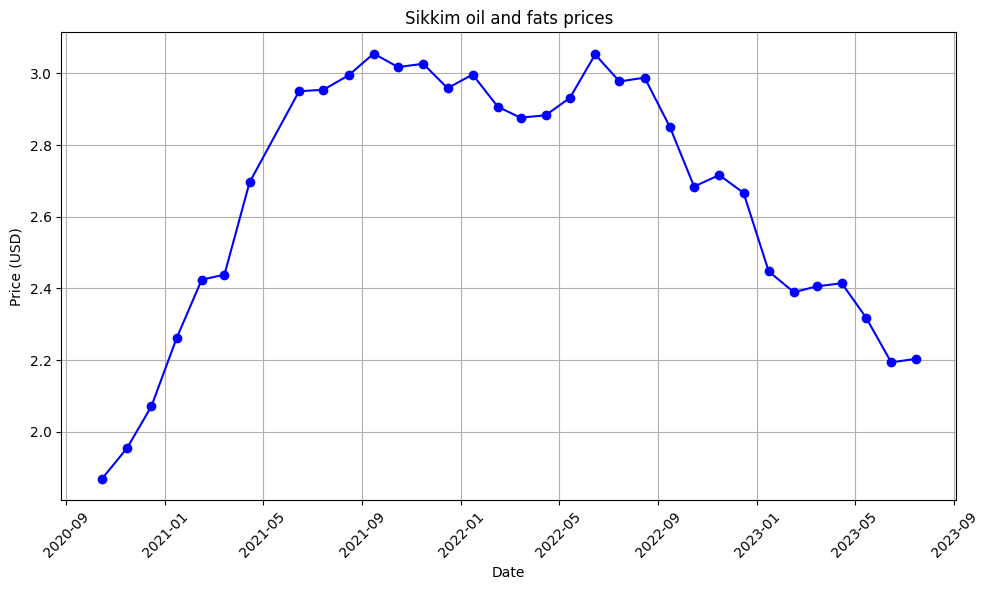

In [19]:
for place in df.admin1.unique():
    df_place = df.groupby('admin1').get_group(place).sort_values(by='usdprice', ascending=True)
    df_place = df_place[['date', 'market', 'category', 'price', 'usdprice']]

    # For a particular City different category prices
    for category in df_place.category.unique():
        df_place_milk = df_place.groupby('category').get_group(category).sort_values(['date', 'usdprice'], ascending=False)
        df_place_milk = df_place_milk[['date', 'market', 'category', 'price', 'usdprice']]
        df_place_milk.drop_duplicates(subset="date", inplace=True)

        plt.figure(figsize=(10, 6))
        plt.plot(df_place_milk['date'], df_place_milk['usdprice'], marker='o', linestyle='-', color='b')
        plt.title(f'{place} {category} prices')
        plt.xlabel('Date')
        plt.ylabel('Price (USD)')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.tight_layout()
        plt.show()